In [ ]:
# to ignore warnings
import warnings
warnings.filterwarnings("ignore")

## EXPLORATORY DATA ANALYSIS

---

In [ ]:
from google.colab  import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
data_path='/content/drive/MyDrive/Colab Notebooks/PPaddy-disease-classification/train_images'

In [1]:
import os

In [ ]:
directory_names = os.listdir(data_path)

for directory in directory_names:
    dir_path = os.path.join(data_path, directory)
    if os.path.isdir(dir_path):
        files = os.listdir(dir_path)
        print(f"{len(files)} \t {directory}")
        for file in files:
          file_path = os.path.join(dir_path, file)
          if file.endswith('.csv'):
              data_path = pd.read_csv(file_path)
              print(f"\nData in {file}:\n{data_path.head()}\n")

385 	 bacterial_leaf_streak
491 	 bacterial_leaf_blight
1092 	 tungro
1764 	 normal
620 	 downy_mildew
973 	 brown_spot
1746 	 blast
1597 	 hispa
1443 	 dead_heart
341 	 bacterial_panicle_blight
1003 	 non_paddy_leaf


In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

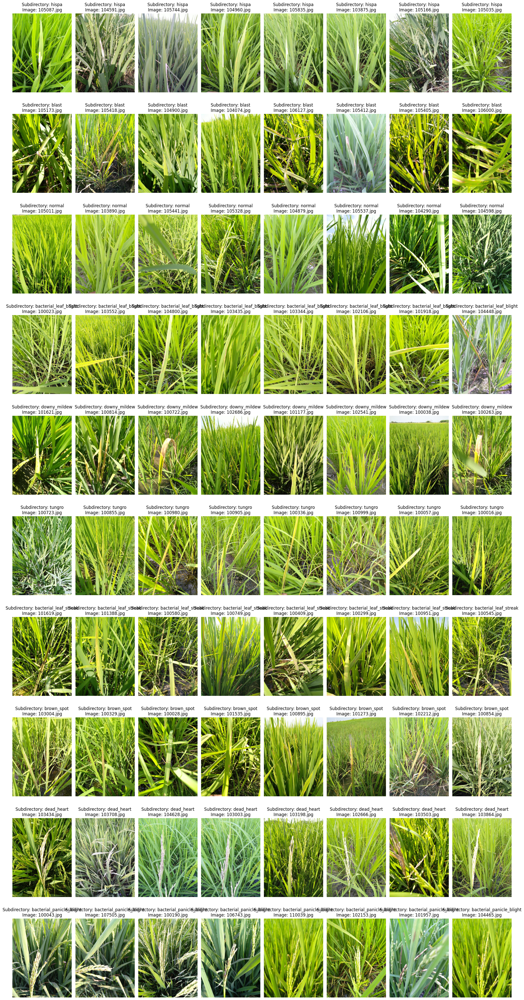

In [ ]:
import matplotlib.image as mpimg

main_dir = '/content/drive/MyDrive/Colab Notebooks/paddy-disease-classification'
train_dir = os.path.join(main_dir, 'train_images')

subdirectories = [subdir for subdir in os.listdir(train_dir) if os.path.isdir(os.path.join(train_dir, subdir))]

plt.figure(figsize=(20, 40))
for i, subdir in enumerate(subdirectories):
    subdir_path = os.path.join(train_dir, subdir)
    image_files = [file for file in os.listdir(subdir_path) if file.lower().endswith(('.png', '.jpg', '.jpeg'))]
    for j in range(min(8, len(image_files))):
        if (i * 8 + j) >= 80:
            break
        image_path = os.path.join(subdir_path, image_files[j])
        img = mpimg.imread(image_path)
        plt.subplot(10, 8, i * 8 + j + 1)
        plt.imshow(img)
        plt.title(f'Subdirectory: {subdir}\nImage: {image_files[j]}')
        plt.axis('off')

plt.tight_layout()
plt.show()

In [3]:
import glob
from pathlib import Path

train_path = '/content/drive/MyDrive/Colab Notebooks/PPaddy-disease-classification/train_images'
test_path  = '/content/drive/MyDrive/Colab Notebooks/PPaddy-disease-classification/test_images'

print('Training datasets')
for filepath in glob.glob(train_path + '/*/'):
  files = glob.glob(filepath + '*')
  print(f"{len(files)} \t {Path(filepath).name}")

Training datasets


## Import the necesary python libraries

In [ ]:
import random
from os import listdir
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Activation, Flatten, Dropout, Dense
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import backend
import matplotlib.pyplot as plt

In [ ]:
SEED = 1234
def set_seed(seed=SEED):
    np.random.seed(seed)
    tf.random.set_seed(seed)
    random.seed(seed)
    os.environ['TF_DETERMINISTIC_OPS'] = "1"
    os.environ['TF_CUDNN_DETERMINISM'] = "1"
    os.environ['PYTHONHASHSEED'] = str(seed)
set_seed()

## Define the necessary constants

In [ ]:
EPOCHS = 100
INIT_LR = 1e-3
BS = 32
default_image_size = tuple((256, 256))
image_size = 0
width = 256
height = 256
depth = 3
n_classes = len(glob.glob(data_path + '/*/'))
print(n_classes)

11


## 3. Dataset preparation (train, validate, and test sets)

### 3a. Setup ImageDataGenerator with different image transformation options to generate diverse training samples.

In [ ]:
image_datagen = ImageDataGenerator(featurewise_center=False,
                samplewise_center=False,
                featurewise_std_normalization=False,
                samplewise_std_normalization=False,
                zca_whitening=False,
                rotation_range=5,
                shear_range=0.2,
                zoom_range=0.2,
                width_shift_range=0.05,
                height_shift_range=0.05,
                channel_shift_range=0.,
                fill_mode='nearest',
                horizontal_flip=True,
                vertical_flip=False,
                rescale=1./255,
                validation_split=0.2)

### 3b. Next, let's configure the train, validate, and test data generators usingflow_from_directory

In [ ]:
train_generator = image_datagen.flow_from_directory(
    directory = data_path,
    subset='training',
    target_size=(256, 256),
    color_mode="rgb",
    batch_size=32,
    class_mode="categorical",
    shuffle=True,
    seed=SEED)
valid_generator = image_datagen.flow_from_directory(
    directory=data_path,
    subset='validation',
    target_size=(256, 256),
    color_mode="rgb",
    batch_size=32,
    class_mode="categorical",
    shuffle=True,
    seed=SEED)
print(train_generator.class_indices)
print(train_generator.samples)

Found 9156 images belonging to 11 classes.
Found 2284 images belonging to 11 classes.
{'bacterial_leaf_blight': 0, 'bacterial_leaf_streak': 1, 'bacterial_panicle_blight': 2, 'blast': 3, 'brown_spot': 4, 'dead_heart': 5, 'downy_mildew': 6, 'hispa': 7, 'non_paddy_leaf': 8, 'normal': 9, 'tungro': 10}
9156


# 4. CNN model

In [ ]:
def get_model():
    model = Sequential()
    inputShape = (height, width, depth)
    chanDim = -1
    print(backend.image_data_format())
    if backend.image_data_format() == "channels_first":
        inputShape = (depth, height, width)
        chanDim = 1
    model.add(Conv2D(32, (3, 3), padding="same", input_shape=inputShape))
    model.add(Activation("relu"))
    model.add(BatchNormalization(axis=chanDim))
    model.add(MaxPooling2D(pool_size=(3, 3)))
    model.add(Dropout(0.25))
    model.add(Conv2D(64, (3, 3), padding="same"))
    model.add(Activation("relu"))
    model.add(BatchNormalization(axis=chanDim))
    model.add(Conv2D(64, (3, 3), padding="same"))
    model.add(Activation("relu"))
    model.add(BatchNormalization(axis=chanDim))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))
    model.add(Conv2D(128, (3, 3), padding="same"))
    model.add(Activation("relu"))
    model.add(BatchNormalization(axis=chanDim))
    model.add(Conv2D(128, (3, 3), padding="same"))
    model.add(Activation("relu"))
    model.add(BatchNormalization(axis=chanDim))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))
    model.add(Flatten())
    model.add(Dense(1024))
    model.add(Activation("relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(n_classes))
    model.add(Activation("softmax"))

    opt = Adam(learning_rate=INIT_LR)
    model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=["accuracy"])
    return model

model = get_model()
model.summary()


channels_last
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 256, 256, 32)      896       
                                                                 
 activation (Activation)     (None, 256, 256, 32)      0         
                                                                 
 batch_normalization (Batch  (None, 256, 256, 32)      128       
 Normalization)                                                  
                                                                 
 max_pooling2d (MaxPooling2  (None, 85, 85, 32)        0         
 D)                                                              
                                                                 
 dropout (Dropout)           (None, 85, 85, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 85, 85

In [ ]:
try:
  import livelossplot
except:
  !pip install livelossplot

from livelossplot.inputs.keras import PlotLossesCallback

plot_loss = PlotLossesCallback()

checkpoint = ModelCheckpoint(filepath='paddy_leaf_anomaly_model.hdf5',
                            save_best_only=True,
                            verbose=1)

# EarlyStopping
early_stop = EarlyStopping(monitor='val_loss',
                          patience=10,
                          restore_best_weights=True,
                          mode='min')

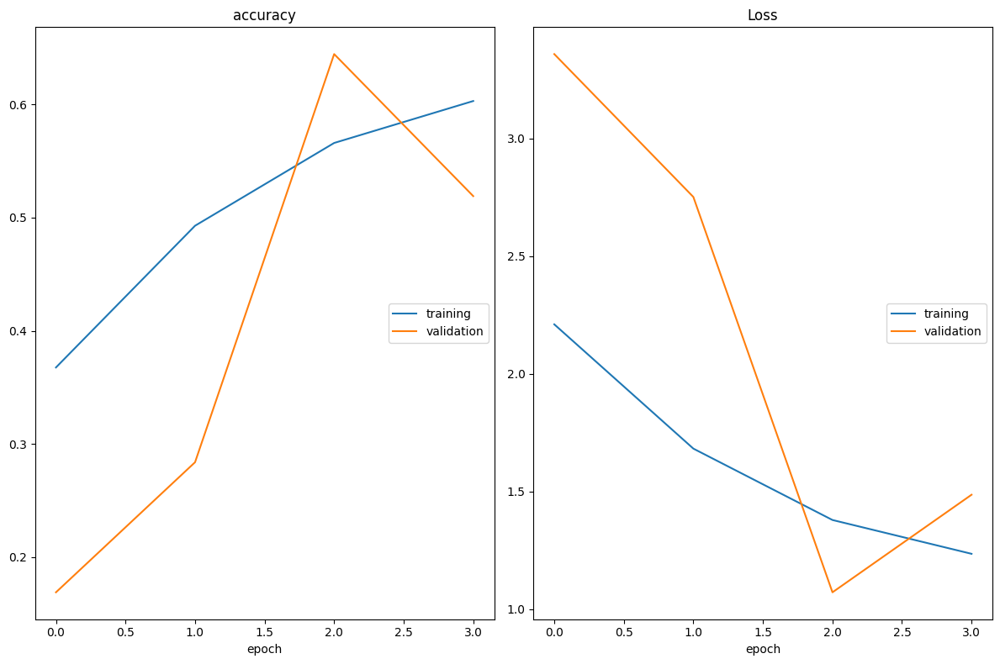

accuracy
	training         	 (min:    0.368, max:    0.603, cur:    0.603)
	validation       	 (min:    0.169, max:    0.644, cur:    0.519)
Loss
	training         	 (min:    1.235, max:    2.210, cur:    1.235)
	validation       	 (min:    1.071, max:    3.358, cur:    1.486)
286/286 [==============================] - 335s 1s/step - loss: 1.2350 - accuracy: 0.6029 - val_loss: 1.4861 - val_accuracy: 0.5189
Epoch 5/100
179/286 [=================>............] - ETA: 1:42 - loss: 1.0574 - accuracy: 0.6596

In [ ]:
%%time
STEP_SIZE_TRAIN = train_generator.n//train_generator.batch_size
STEP_SIZE_VALID = valid_generator.n//valid_generator.batch_size
history = model.fit_generator(generator = train_generator,
                              steps_per_epoch = STEP_SIZE_TRAIN,
                              validation_steps = STEP_SIZE_VALID,
                              validation_data = valid_generator,
                              callbacks=[checkpoint, early_stop, plot_loss],
                              epochs=EPOCHS,
                              verbose=1)

In [ ]:
def define_paths(dir):
    filepaths = []
    labels = []

    folds = os.listdir(dir)
    for fold in folds:
        foldpath = os.path.join(dir, fold)
        filelist = os.listdir(foldpath)
        for file in filelist:
            fpath = os.path.join(foldpath, file)
            filepaths.append(fpath)
            labels.append(fold)

    return filepaths, labels


def define_df(files, classes):
    Fseries = pd.Series(files, name= 'filepaths')
    Lseries = pd.Series(classes, name='labels')
    return pd.concat([Fseries, Lseries], axis= 1)


# Splitting data into train, validation, and test
def split_data(tr_dir):
    # train dataframe
    files, classes = define_paths(data_dir)
    df = define_df(files, classes)

    strat = df['labels']
    train_df, dummy_df = train_test_split(df,  train_size= 0.8, shuffle= True, random_state= 123, stratify= strat)

    # valid and test dataframe
    strat = dummy_df['labels']
    valid_df, test_df = train_test_split(dummy_df,  train_size= 0.5, shuffle= True, random_state= 123, stratify= strat)

    return train_df, valid_df, test_df

In [ ]:
def create_model_data (train_df, valid_df, test_df, batch_size):

    ''' This function takes train, validation, and test dataframe and fit them into image data generator, because model takes
         data from image data generator.
         Image data generator converts images into tensors. '''


    # define model parameters
    img_size = (224, 224)
    channels = 3 # either BGR or Grayscale
    color = 'rgb'
    img_shape = (img_size[0], img_size[1], channels)

    ts_length = len(test_df)
    test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
    test_steps = ts_length // test_batch_size

    def scalar(img): #for data augmentation
        return img

    tr_gen = ImageDataGenerator(preprocessing_function= scalar, horizontal_flip= True)
    ts_gen = ImageDataGenerator(preprocessing_function= scalar)

    train_gen = tr_gen.flow_from_dataframe( train_df, x_col= 'filepaths', y_col= 'labels', target_size= img_size, class_mode= 'categorical',
                                        color_mode= color, shuffle= True, batch_size= batch_size)

    valid_gen = ts_gen.flow_from_dataframe( valid_df, x_col= 'filepaths', y_col= 'labels', target_size= img_size, class_mode= 'categorical',
                                        color_mode= color, shuffle= True, batch_size= batch_size)

    # Using custom test_batch_size, and making shuffle= false
    test_gen = ts_gen.flow_from_dataframe( test_df, x_col= 'filepaths', y_col= 'labels', target_size= img_size, class_mode= 'categorical',
                                        color_mode= color, shuffle= False, batch_size= test_batch_size)
    return train_gen, valid_gen, test_gen

In [ ]:
def show_images(gen):

    g_dict = gen.class_indices
    classes = list(g_dict.keys())
    images, labels = next(gen)

    length = len(labels)
    sample = min(length, 25)

    plt.figure(figsize= (20, 20))

    for i in range(sample):
        plt.subplot(5, 5, i + 1)
        image = images[i] / 255
        plt.imshow(image)
        index = np.argmax(labels[i])
        class_name = classes[index]
        plt.title(class_name, color= 'blue', fontsize= 12)
        plt.axis('off')
    plt.show()

In [ ]:
class MyCallback(keras.callbacks.Callback):
    def __init__(self, model, base_model, patience, stop_patience, threshold, factor, batches, epochs, ask_epoch):
        super(MyCallback, self).__init__()
        self.model = model
        self.base_model = base_model
        self.patience = patience
        self.stop_patience = stop_patience
        self.threshold = threshold
        self.factor = factor
        self.batches = batches
        self.epochs = epochs
        self.ask_epoch = ask_epoch
        self.ask_epoch_initial = ask_epoch

        # callback variables
        self.count = 0
        self.stop_count = 0
        self.best_epoch = 1
        self.initial_lr = float(tf.keras.backend.get_value(model.optimizer.lr))
        self.highest_tracc = 0.0
        self.lowest_vloss = np.inf
        self.best_weights = self.model.get_weights()
        self.initial_weights = self.model.get_weights()

    # Define a function that will run when train begins
    def on_train_begin(self, logs= None):
        msg = '{0:^8s}{1:^10s}{2:^9s}{3:^9s}{4:^9s}{5:^9s}{6:^9s}{7:^10s}{8:10s}{9:^8s}'.format('Epoch', 'Loss', 'Accuracy', 'V_loss', 'V_acc', 'LR', 'Next LR', 'Monitor','% Improv', 'Duration')
        print(msg)
        self.start_time = time.time()


    def on_train_end(self, logs= None):
        stop_time = time.time()
        tr_duration = stop_time - self.start_time
        hours = tr_duration // 3600
        minutes = (tr_duration - (hours * 3600)) // 60
        seconds = tr_duration - ((hours * 3600) + (minutes * 60))

        msg = f'training elapsed time was {str(hours)} hours, {minutes:4.1f} minutes, {seconds:4.2f} seconds)'
        print(msg)

        self.model.set_weights(self.best_weights)


    def on_train_batch_end(self, batch, logs= None):
        acc = logs.get('accuracy') * 100
        loss = logs.get('loss')

        msg = '{0:20s}processing batch {1:} of {2:5s}-   accuracy=  {3:5.3f}   -   loss: {4:8.5f}'.format(' ', str(batch), str(self.batches), acc, loss)
        print(msg, '\r', end= '')


    def on_epoch_begin(self, epoch, logs= None):
        self.ep_start = time.time()

    # Defining method runs on the end of each epoch
    def on_epoch_end(self, epoch, logs= None):
        ep_end = time.time()
        duration = ep_end - self.ep_start

        lr = float(tf.keras.backend.get_value(self.model.optimizer.lr)) # get the current learning rate
        current_lr = lr
        acc = logs.get('accuracy')
        v_acc = logs.get('val_accuracy')
        loss = logs.get('loss')
        v_loss = logs.get('val_loss')

        if acc < self.threshold:
            monitor = 'accuracy'
            if epoch == 0:
                pimprov = 0.0
            else:
                pimprov = (acc - self.highest_tracc ) * 100 / self.highest_tracc

            if acc > self.highest_tracc:
                self.highest_tracc = acc
                self.best_weights = self.model.get_weights()
                self.count = 0
                self.stop_count = 0
                if v_loss < self.lowest_vloss:
                    self.lowest_vloss = v_loss
                self.best_epoch = epoch + 1

            else:
                if self.count >= self.patience - 1:
                    lr = lr * self.factor
                    tf.keras.backend.set_value(self.model.optimizer.lr, lr)
                    self.count = 0
                    self.stop_count = self.stop_count + 1
                    self.count = 0
                    if v_loss < self.lowest_vloss:
                        self.lowest_vloss = v_loss
                else:
                    self.count = self.count + 1

        else:
            monitor = 'val_loss'
            if epoch == 0:
                pimprov = 0.0
            else:
                pimprov = (self.lowest_vloss - v_loss ) * 100 / self.lowest_vloss
            if v_loss < self.lowest_vloss:
                self.lowest_vloss = v_loss
                self.best_weights = self.model.get_weights()
                self.count = 0
                self.stop_count = 0
                self.best_epoch = epoch + 1
            else: # validation loss did not improve
                if self.count >= self.patience - 1:
                    lr = lr * self.factor
                    self.stop_count = self.stop_count + 1
                    self.count = 0
                    tf.keras.backend.set_value(self.model.optimizer.lr, lr)
                else:
                    self.count = self.count + 1
                if acc > self.highest_tracc:
                    self.highest_tracc = acc

        msg = f'{str(epoch + 1):^3s}/{str(self.epochs):4s} {loss:^9.3f}{acc * 100:^9.3f}{v_loss:^9.5f}{v_acc * 100:^9.3f}{current_lr:^9.5f}{lr:^9.5f}{monitor:^11s}{pimprov:^10.2f}{duration:^8.2f}'
        print(msg)

        if self.stop_count > self.stop_patience - 1:
            msg = f' training has been halted at epoch {epoch + 1} after {self.stop_patience} adjustments of learning rate with no improvement'
            print(msg)
            self.model.stop_training = True # stop training

In [ ]:
def plot_training(hist):
    tr_acc = hist.history['accuracy']
    tr_loss = hist.history['loss']
    val_acc = hist.history['val_accuracy']
    val_loss = hist.history['val_loss']
    index_loss = np.argmin(val_loss)
    val_lowest = val_loss[index_loss]
    index_acc = np.argmax(val_acc)
    acc_highest = val_acc[index_acc]

    plt.figure(figsize= (20, 8))
    # plt.style.use('fivethirtyeight')
    Epochs = [i+1 for i in range(len(tr_acc))]
    loss_label = f'best epoch= {str(index_loss + 1)}'
    acc_label = f'best epoch= {str(index_acc + 1)}'
    plt.subplot(1, 2, 1)
    plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
    plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
    plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.subplot(1, 2, 2)
    plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
    plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
    plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.tight_layout
    plt.show()

In [ ]:
import itertools

In [ ]:
def plot_confusion_matrix(cm, classes, normalize= False, title= 'Confusion Matrix', cmap= plt.cm.Blues):
	plt.figure(figsize= (10, 10))
	plt.imshow(cm, interpolation= 'nearest', cmap= cmap)
	plt.title(title)
	plt.colorbar()
	tick_marks = np.arange(len(classes))
	plt.xticks(tick_marks, classes, rotation= 45)
	plt.yticks(tick_marks, classes)
	if normalize:
		cm = cm.astype('float') / cm.sum(axis= 1)[:, np.newaxis]
		print('Normalized Confusion Matrix')
	else:
		print('Confusion Matrix, Without Normalization')
	print(cm)
	thresh = cm.max() / 2.
	for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
		plt.text(j, i, cm[i, j], horizontalalignment= 'center', color= 'white' if cm[i, j] > thresh else 'black')
	plt.tight_layout()
	plt.ylabel('True Label')
	plt.xlabel('Predicted Label')

In [ ]:
data_dir =  '/content/drive/MyDrive/Colab Notebooks/PPaddy-disease-classification/train_images'
train_df, valid_df, test_df = split_data(data_dir)

# Get Generators
batch_size = 40
train_gen, valid_gen, test_gen = create_model_data(train_df, valid_df, test_df, batch_size)

# show_images(train_gen)

Found 9152 validated image filenames belonging to 11 classes.
Found 1143 validated image filenames belonging to 11 classes.
Found 1145 validated image filenames belonging to 11 classes.


In [5]:
# importing Deep learning Libraries
import time
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Activation, Dropout, BatchNormalization
from tensorflow.keras.models import Model, load_model, Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import train_test_split
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras import regularizers
from tensorflow.keras.metrics import categorical_crossentropy

In [ ]:
# Creating Model Structure
img_size = (224, 224)
channels = 3
img_shape = (img_size[0], img_size[1], channels)
class_count = len(list(train_gen.class_indices.keys()))

# creating pre-trained model
base_model = tf.keras.applications.efficientnet.EfficientNetB3(include_top= False, weights= "imagenet", input_shape= img_shape, pooling= 'max')

model = Sequential([
    base_model,
    BatchNormalization(axis= -1, momentum= 0.99, epsilon= 0.001),
    Dense(256, kernel_regularizer= regularizers.l2(l= 0.016), activity_regularizer= regularizers.l1(0.006),
                bias_regularizer= regularizers.l1(0.006), activation= 'relu'),
    Dropout(rate= 0.45, seed= 123), #Helps prevent overfitting
    Dense(class_count, activation= 'softmax')
])

model.compile(Adamax(learning_rate= 0.001), loss= 'categorical_crossentropy', metrics= ['accuracy'])

model.summary()


43941136/43941136 [==============================] - 0s 0us/step
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb3 (Functional  (None, 1536)              10783535  
 )                                                               
                                                                 
 batch_normalization (Batch  (None, 1536)              6144      
 Normalization)                                                  
                                                                 
 dense (Dense)               (None, 256)               393472    
                                                                 
 dropout (Dropout)           (None, 256)               0         
                                                                 
 dense_1 (Dense)             (None, 11)                2827      
                                                         

In [ ]:
batch_size = 40
epochs = 20
patience = 1 		    # number of epochs to wait to adjust lr if monitored value does not improve
stop_patience = 3 	# number of epochs to wait before stopping training if monitored value does not improve
threshold = 0.9
factor = 0.5 		    # factor to reduce lr by
ask_epoch = 5		    # number of epochs to run before asking if you want to halt training
batches = int(np.ceil(len(train_gen.labels) / batch_size))    # number of training batch to run per epoch

callbacks = [MyCallback(model= model, base_model= base_model, patience= patience,
            stop_patience= stop_patience, threshold= threshold, factor= factor,
            batches= batches, epochs= epochs, ask_epoch= ask_epoch )]

In [ ]:
history = model.fit(x= train_gen, epochs= epochs, verbose= 0, callbacks= callbacks,
                    validation_data= valid_gen, validation_steps= None, shuffle= False)

 Epoch     Loss   Accuracy  V_loss    V_acc     LR     Next LR  Monitor  % Improv  Duration
 1 /20     7.119   65.680   5.03040  85.127   0.00100  0.00100  accuracy     0.00   3399.15 
 2 /20     3.907   89.073   2.90056  93.088   0.00100  0.00100  accuracy    35.62    149.60 
 3 /20     2.267   94.569   1.69754  94.838   0.00100  0.00100  val_loss    41.48    149.71 
 4 /20     1.325   96.514   1.04337  95.626   0.00100  0.00100  val_loss    38.54    149.37 
 5 /20     0.808   97.705   0.67406  96.763   0.00100  0.00100  val_loss    35.40    149.93 
 6 /20     0.548   98.208   0.50388  96.150   0.00100  0.00100  val_loss    25.25    149.74 
 7 /20     0.410   98.711   0.45290  95.538   0.00100  0.00100  val_loss    10.12    149.30 
 8 /20     0.342   98.918   0.37117  96.763   0.00100  0.00100  val_loss    18.05    149.43 
 9 /20     0.308   98.733   0.34330  96.588   0.00100  0.00100  val_loss     7.51    149.28 
10 /20     0.289   98.667   0.36940  96.063   0.00100  0.00050  val_los

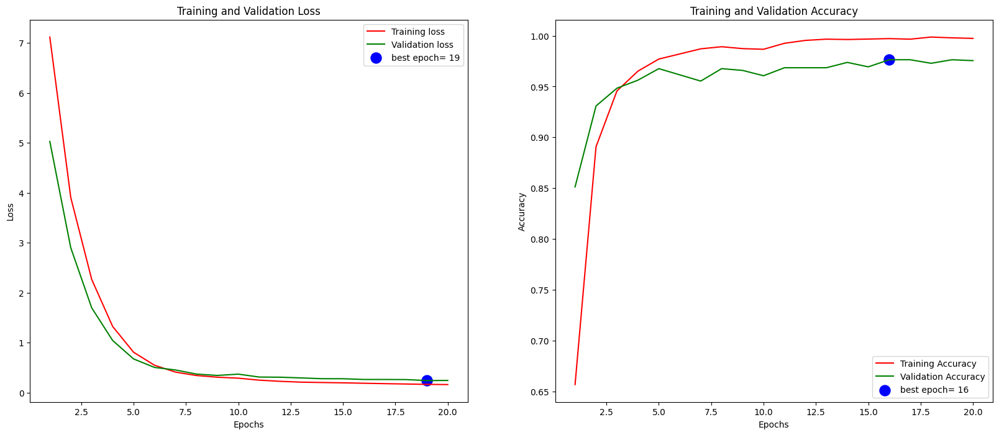

In [ ]:
plot_training(history)

In [ ]:
ts_length = len(test_df)
test_batch_size = test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = model.evaluate(test_gen, steps= test_steps, verbose= 1)

print("Train Loss: ", train_score[0])
print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

 29/191 [===>..........................] - ETA: 43s - loss: 0.2406 - accuracy: 0.9764

191/191 [==============================] - 374s 2s/step - loss: 0.2593 - accuracy: 0.9721
Train Loss:  0.13514851033687592
Train Accuracy:  0.9996073246002197
--------------------
Validation Loss:  0.24057964980602264
Validation Accuracy:  0.9763779640197754
--------------------
Test Loss:  0.25928032398223877
Test Accuracy:  0.9720523953437805


In [ ]:
preds = model.predict_generator(test_gen)
y_pred = np.argmax(preds, axis=1)
print(y_pred)

[3 7 1 ... 3 5 5]


Confusion Matrix, Without Normalization
[[ 49   0   0   0   0   0   0   0   0   0   0]
 [  0  37   0   0   1   0   0   0   0   0   0]
 [  0   0  32   0   0   1   0   0   0   1   0]
 [  1   0   0 167   0   0   0   1   2   4   0]
 [  0   0   0   1  92   0   0   0   0   2   2]
 [  0   0   1   0   0 143   0   0   1   0   0]
 [  0   0   0   2   1   0  58   0   0   1   0]
 [  0   0   0   0   0   0   0 157   0   3   0]
 [  0   0   0   1   0   0   0   0  98   0   0]
 [  0   0   1   0   0   0   0   2   0 173   1]
 [  0   0   0   1   0   0   1   0   0   0 107]]
                          precision    recall  f1-score   support

   bacterial_leaf_blight       0.98      1.00      0.99        49
   bacterial_leaf_streak       1.00      0.97      0.99        38
bacterial_panicle_blight       0.94      0.94      0.94        34
                   blast       0.97      0.95      0.96       175
              brown_spot       0.98      0.95      0.96        97
              dead_heart       0.99      0.99

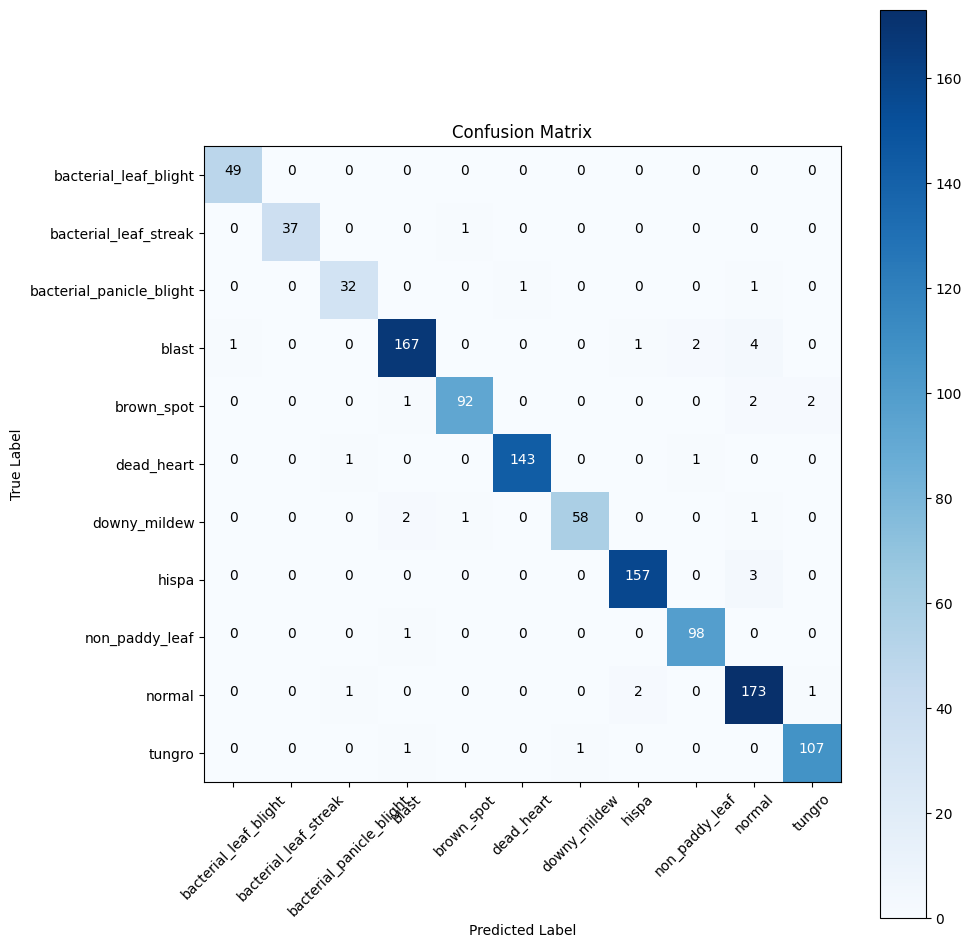

In [ ]:
g_dict = test_gen.class_indices
classes = list(g_dict.keys())

# Confusion matrix
cm = confusion_matrix(test_gen.classes, y_pred)
plot_confusion_matrix(cm= cm, classes= classes, title = 'Confusion Matrix')

# Classification report
print(classification_report(test_gen.classes, y_pred, target_names= classes))

In [ ]:
model_name = model.input_names[0][:-6]
subject = 'paddy-disease-detection'
acc = test_score[1] * 100
save_path = ''

# Save model
save_id = str(f'{model_name}-{subject}-{"%.1f" %round(acc, 2)}.h5')
model_save_loc = os.path.join(save_path, save_id)
model.save(model_save_loc)
print(f'model was saved as {model_save_loc}')

# Save weights
weight_save_id = str(f'{model_name}-{subject}-weights.h5')
weights_save_loc = os.path.join(save_path, weight_save_id)
model.save_weights(weights_save_loc)
print(f'weights were saved as {weights_save_loc}')

model was saved as efficientnetb3-paddy-disease-detection-97.2.h5
weights were saved as efficientnetb3-paddy-disease-detection-weights.h5


In [ ]:
class_dict = train_gen.class_indices
img_size = train_gen.image_shape
height = []
width = []
for _ in range(len(class_dict)):
    height.append(img_size[0])
    width.append(img_size[1])

Index_series = pd.Series(list(class_dict.values()), name= 'class_index')
Class_series = pd.Series(list(class_dict.keys()), name= 'class')
Height_series = pd.Series(height, name= 'height')
Width_series = pd.Series(width, name= 'width')
class_df = pd.concat([Index_series, Class_series, Height_series, Width_series], axis= 1)
csv_name = f'{subject}-class_dict.csv'
csv_save_loc = os.path.join(save_path, csv_name)
class_df.to_csv(csv_save_loc, index= False)
print(f'class csv file was saved as {csv_save_loc}')

class csv file was saved as paddy-disease-detection-class_dict.csv


In [ ]:
# Generate images
test_data = tf.keras.utils.image_dataset_from_directory("/content/drive/MyDrive/Colab Notebooks/PPaddy-disease-classification/test_images",
                                                        labels=None, label_mode=None, color_mode='rgb',
                                                        image_size=(224,224), shuffle=False)

Found 3672 files belonging to 1 classes.


In [ ]:
# Get test prediction
preds = model.predict_generator(test_data)
y_pred = np.argmax(preds, axis=1)
y_pred

array([7, 9, 3, ..., 8, 8, 4])

In [ ]:
# get classes

predictions = []

for i in list(y_pred):
    if i == 0:
        predictions.append('bacterial_leaf_blight')

    elif i == 1:
        predictions.append('bacterial_leaf_streak')

    elif i == 2:
        predictions.append('bacterial_panicle_blight')

    elif i == 3:
        predictions.append('blast')

    elif i == 4:
        predictions.append('brown_spot')

    elif i == 5:
        predictions.append('dead_heart')

    elif i == 6:
        predictions.append('downy_mildew')

    elif i == 7:
        predictions.append('hispa')

    elif i == 8:
        predictions.append('non_paddy_leaf')

    elif i == 9:
        predictions.append('normal')

    elif i == 10:
        predictions.append('tungro')

In [ ]:
predictions[:5]

['hispa', 'normal', 'blast', 'blast', 'blast']

### Converting the Keras model to a TensorFlow Lite model

In [6]:
from tensorflow.keras.models import load_model

In [7]:
keras_model = load_model('/content/efficientnetb3-paddy-disease-detection-97.2.h5')

In [8]:
converter = tf.lite.TFLiteConverter.from_keras_model(keras_model)
tflite_model = converter.convert()

### Saving the TensorFlow Lite model to the computer

In [9]:
with open('paddy_leaf_diseases_detection_with_anomaly_detection.tflite', 'wb') as f:
    f.write(tflite_model)